# Peer Institutes

## Introduction

Within higher education, peer institutes are colleges and universities similair to your own, based on shared characteristics such as academic offerings, enrollment, admissions criteria, and financials measures. These schools are used as benchmarks to evaluate performance, set goals, and inform strategic planning.

In my experience, most institutions do not use a particularly rigorous or data-driven methodology when selecting peer institutions. Instead, peer schools are often chosen by senior leadership based on subjective perceptions. As a result, peer lists frequently include aspirational peers rather than true comparables.

Here, I present a simple, quantitative methodology for indentying peer institutes. 


## Data & Packages

First, we'll load the necessary packages and data. The dataset comes from the U.S. Department of Education’s Integrated Postsecondary Education Data System (IPEDS). The data has already been cleaned, so I won’t be covering that process here—but if you’re interested, you can check it out [here](https://htmlpreview.github.io/?https://github.com/jason-hanser/peer-institutes/blob/main/analysis.html).

The final dataset includes 20 variables for 507 public universities. These variables are wide-ranging and were selected to provide a holistic portrait of each institution. I won’t go into detail on each one, but they include:

|                                                        |                                                        | 
|--------------------------------------------------------|--------------------------------------------------------|
| Admit Rate                                             | Yield Rate                                             |
| Percentage of Freshmen Receiving a Pell Grant          | Percentage of Freshmen Receiving Institution Grant Aid |
| Percentage of Freshmen who are Living On Campus        | Total Number of Graduate Students                      |
| Total Number of Degree Seeking Undergraduates          | Total Number of Non-Degree Seeking Undergraduates      |
| Four Year Graduation Rate                              | Six Year Graduation Rate                               |
| Percentage of Freshmen who are In-State                | Instructional Expenses per Undergraduates              |
| Research Expenses per Undergraduate                    | Endowment per Undergraduate                            |
| Percentage of Revenue coming from Tuition              | Discount Rate                                          |
| In-State Tuition                                       | Out-of-State Tuition                                   |
| Student-Faculty Ratio                                  | Retention Rate                                         |


In [1]:
## loading packages
import pandas            as pd
import numpy             as np
import matplotlib.pyplot as plt
import seaborn           as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics       import pairwise_distances

## loading data
df_ipeds = pd.read_csv("clean_data.csv")


## Data Prep

First, the dataset includes several count-based variables that are highly skewed, so we’ll apply a log transformation to those. Then, we’ll scale the data using Z-score normalization.

In [2]:
## log transforming some variables
df_scaled = (df_ipeds
             .assign(ENROLL_GRAD_ALL     = np.log(df_ipeds["ENROLL_GRAD_ALL"]+1),
                     ENROLL_UGRAD_DS     = np.log(df_ipeds["ENROLL_UGRAD_DS"]+1),
                     ENROLL_UGRAD_NDS    = np.log(df_ipeds["ENROLL_UGRAD_NDS"]+1),
                     INSTRUCT_EXP_PER_UG = np.log(df_ipeds["INSTRUCT_EXP_PER_UG"]+1),
                     RESEARCH_EXP_PER_UG = np.log(df_ipeds["RESEARCH_EXP_PER_UG"]+1),
                     ENDOWMENT_PER_UG    = np.log(df_ipeds["ENDOWMENT_PER_UG"]+1))
)

## scaling/normalizing data
scale     = StandardScaler()
df_scaled = scale.fit_transform(df_scaled.iloc[:,4:24]) 
df_scaled = pd.concat([df_ipeds.iloc[:,0:4], pd.DataFrame(df_scaled)], axis = 1)
df_scaled.columns = df_ipeds.columns


Below are the pairwise plots for the variables in our dataset. As expected, some variables are correlated. In some cases, the correlation reflects an inherent relationship (e.g. 4-year and 6-year graduation rates). In others, the association is less causal (e.g. 6-year graduation rate and the percentage of students receiving a Pell Grant).

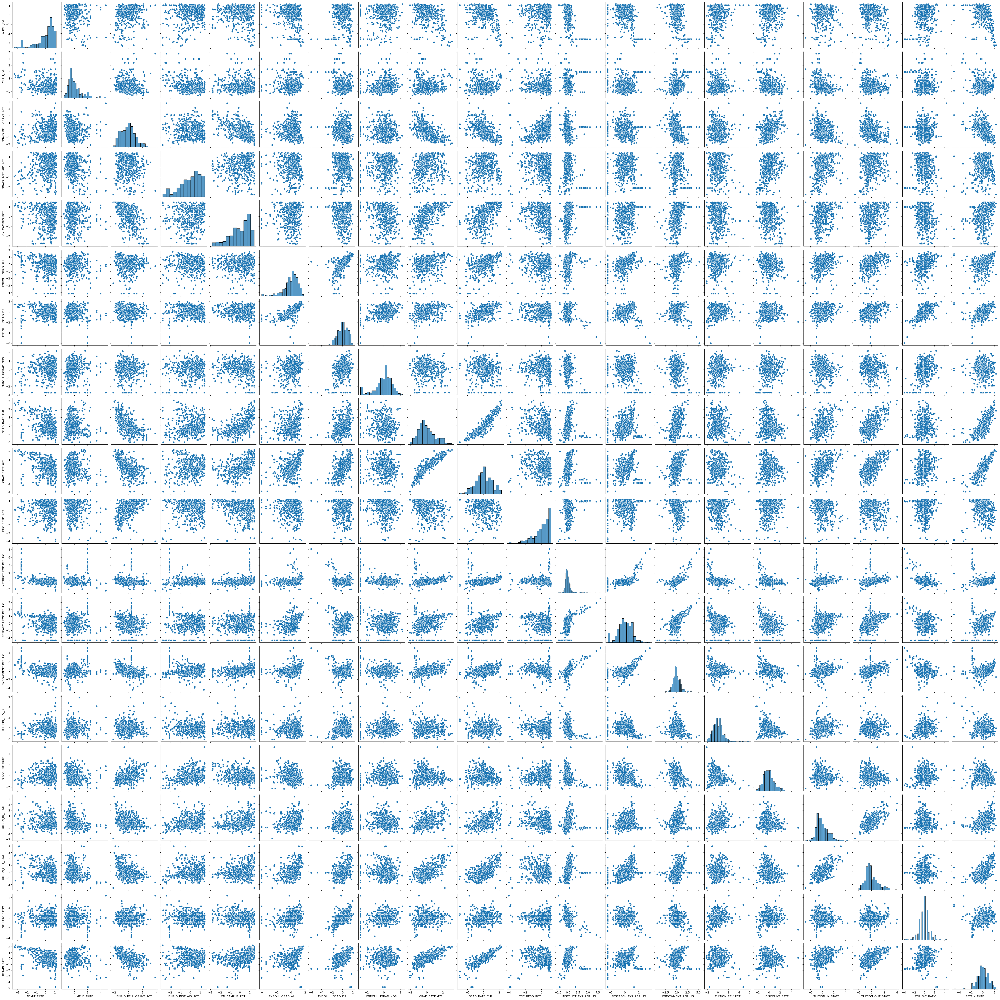

In [3]:
## plotting pairwise comparisons
sns.pairplot(df_scaled.iloc[:,4:24])

Next, we’ll use Principal Components Analysis (PCA) to reduce the number of features in our dataset. This offers two key benefits: first, it addresses multicollinearity among variables; second, it mitigates potential issues related to the “curse of dimensionality.”

As shown below, we’re able to reduce the number of features from 20 to 14 while retaining 95% of the variation in the data.

In [4]:
## PCA 
pca    = PCA(n_components = 0.95)
df_pca = pca.fit_transform(df_scaled.iloc[:,4:24])
df_pca = pd.DataFrame(df_pca, columns = [f"PC_{i+1}" for i in range(0, len(df_pca[0]))])

A quick look at the pairwise plots for our principal components confirms they are not correlated. 

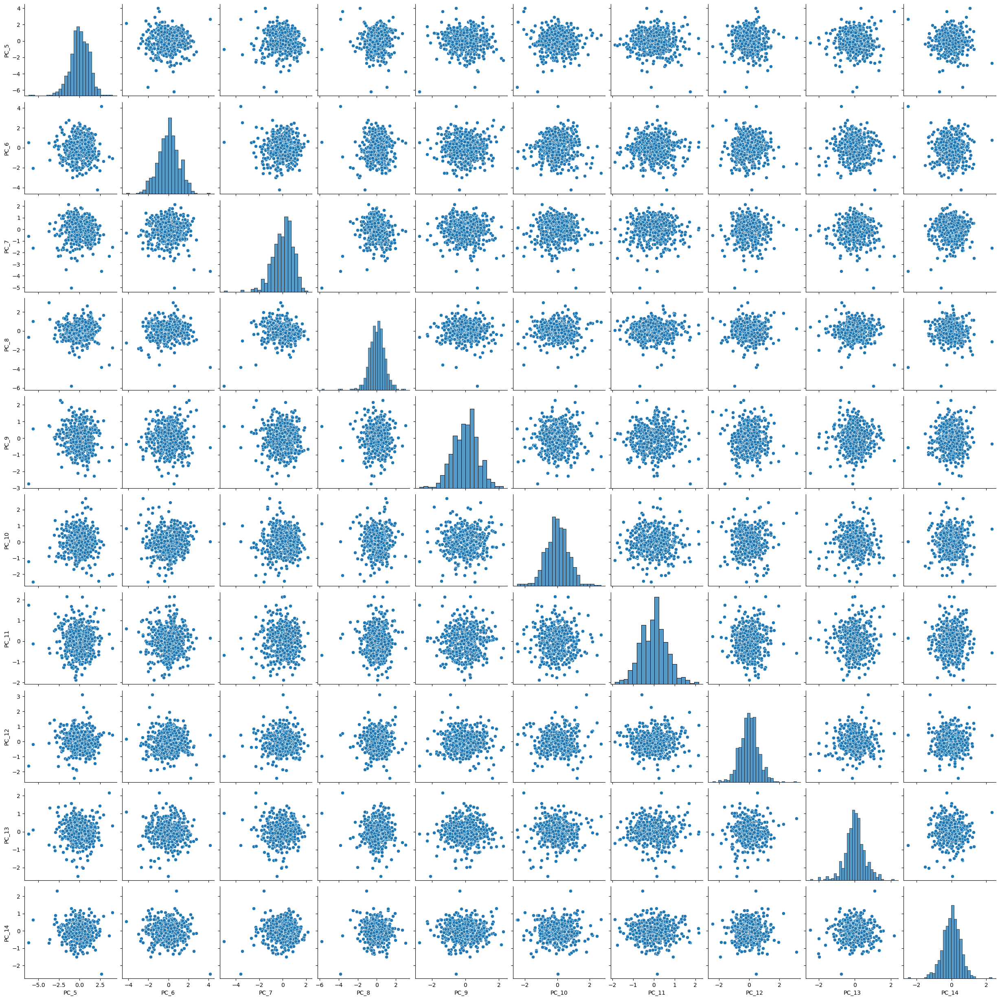

In [5]:
## plotting pairwise comparisons
sns.pairplot(df_pca.iloc[:,4:24])

Finally, we calculate the Euclidean distance between each school based on the 14 features. This distance serves as the foundation for identifying peer institutions—the underlying idea being that similar schools should be closer in feature space.

In [6]:
## Distance matrix
df_dist = pd.DataFrame(pairwise_distances(df_pca, metric = 'euclidean'), columns = df_ipeds["INST_ID"])
df_dist = pd.concat([df_ipeds.iloc[:,0:2], df_dist], axis = 1)

## transforming & cleaning
df_dist = (df_dist
           .melt(id_vars = ["INST_ID", "INST_NAME"], var_name   = "PEER_ID", value_name = "DISTANCE")
           .merge(df_ipeds.iloc[:,0:2], left_on = "PEER_ID", right_on = "INST_ID", how = "left")
           [["INST_ID_x", "INST_NAME_x", "INST_ID_y", "INST_NAME_y", "DISTANCE"]]
           .rename(columns = {"INST_ID_x"   : "INST_ID",
                              "INST_NAME_x" : "INST_NAME",
                              "INST_ID_y"   : "PEER_ID",
                              "INST_NAME_y" : "PEER_NAME"})
           .assign(DISTANCE = lambda x : round(x["DISTANCE"], 3))
)


## Results

Below we can see the most similar schools to University of Utah - which include several other large, access-oriented flagship universities.

In [7]:
df_peers = (df_dist
            .loc[(df_dist["INST_ID"] == 230764)]
            .sort_values("DISTANCE")
            .head(11)
            .reset_index(drop = True)
)

df_peers[["PEER_NAME", "DISTANCE"]]

,PEER_NAME,DISTANCE
0,University of Utah,0.000
1,University of Kansas,2.214
2,University of Nevada-Reno,2.306
3,Utah State University,2.392
4,University of Iowa,2.472
5,Kansas State University,2.597
6,University of Kentucky,2.606
7,The University of Montana,2.612
8,University of Toledo,2.693
9,West Virginia University,2.808


We can plot the distribution of each variable for the peer institutions compared to all other institutions in our data set. The peers are characterized as having a slightly high admit rate, a higher graduation and retention rate, a greater proportion of non-resident students, larger endowments, and more money spent on research. 

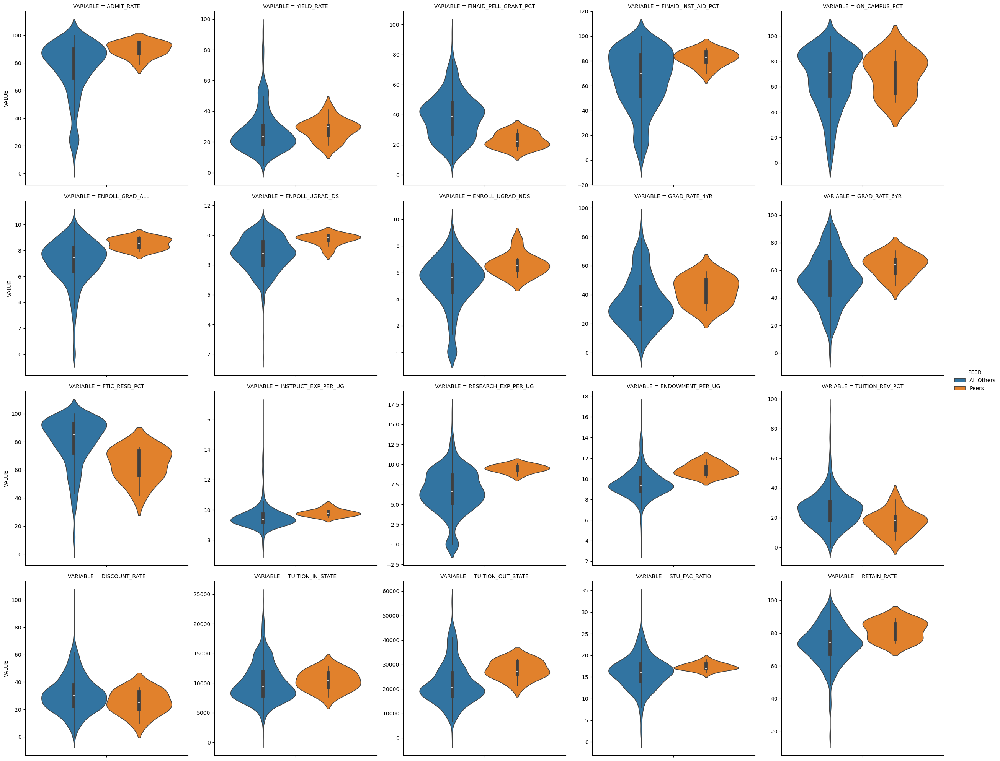

In [8]:
## 
df_temp = (df_ipeds
           .loc[df_ipeds["INST_ID"] != 230764]
           .assign(ENROLL_GRAD_ALL     = np.log(df_ipeds["ENROLL_GRAD_ALL"]+1),
                   ENROLL_UGRAD_DS     = np.log(df_ipeds["ENROLL_UGRAD_DS"]+1),
                   ENROLL_UGRAD_NDS    = np.log(df_ipeds["ENROLL_UGRAD_NDS"]+1),
                   INSTRUCT_EXP_PER_UG = np.log(df_ipeds["INSTRUCT_EXP_PER_UG"]+1),
                   RESEARCH_EXP_PER_UG = np.log(df_ipeds["RESEARCH_EXP_PER_UG"]+1),
                   ENDOWMENT_PER_UG    = np.log(df_ipeds["ENDOWMENT_PER_UG"]+1))
           .melt(id_vars = df_ipeds.iloc[:,0:4].columns, var_name = "VARIABLE", value_name = "VALUE")
           .merge(df_peers[["PEER_ID", "DISTANCE"]], left_on = "INST_ID", right_on = "PEER_ID", how = "left")
           .assign(PEER = lambda x : np.where(x["PEER_ID"].isnull(), "All Others", "Peers"))
)

## plotting variables
sns.catplot(data = df_temp, 
            kind = "violin", 
            hue  = "PEER",
            y    = "VALUE", 
            col  = "VARIABLE", 
            col_wrap = 5,
            sharey   = False)

We can also examine the most similar schools to the University of California - Berkeley. This list contains several other UC schools as well as some more prestigious public univeristy from out east, such as UNC - Chapel Hill.

In [9]:
df_peers = (df_dist
            .loc[(df_dist["INST_ID"] == 110635)]
            .sort_values("DISTANCE")
            .head(11)
            .reset_index(drop = True)
)

df_peers[["PEER_NAME", "DISTANCE"]]

,PEER_NAME,DISTANCE
0,University of California-Berkeley,0.000
1,University of California-Los Angeles,2.162
2,University of California-San Diego,2.766
3,University of California-Irvine,2.794
4,University of North Carolina at Chapel Hill,3.079
5,The University of Texas at Austin,3.096
6,University of California-Davis,3.259
7,University of Georgia,3.559
8,Virginia Polytechnic Institute and State Unive...,3.591
9,University of Maryland-College Park,3.724


As you might expect, these schools have a much lower admit rate, incredibly high graduation and retention rates, and a much lower percent of students receiving a Pell Grant.

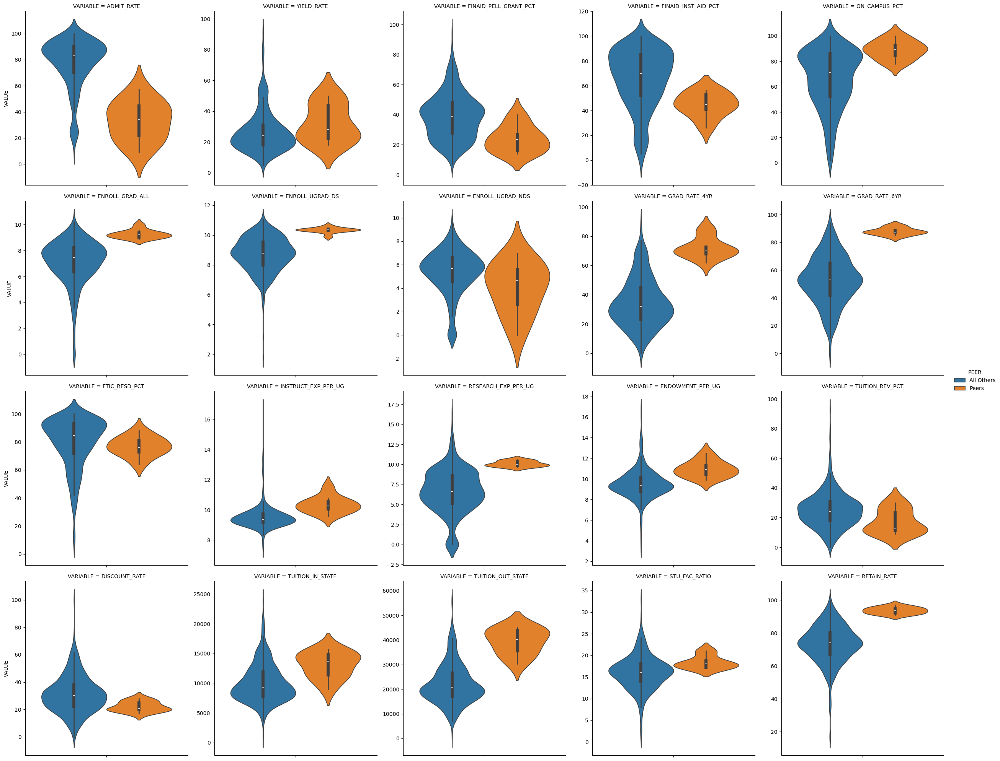

In [10]:
df_temp = (df_ipeds
           .loc[df_ipeds["INST_ID"] != 110635]
           .assign(ENROLL_GRAD_ALL     = np.log(df_ipeds["ENROLL_GRAD_ALL"]+1),
                   ENROLL_UGRAD_DS     = np.log(df_ipeds["ENROLL_UGRAD_DS"]+1),
                   ENROLL_UGRAD_NDS    = np.log(df_ipeds["ENROLL_UGRAD_NDS"]+1),
                   INSTRUCT_EXP_PER_UG = np.log(df_ipeds["INSTRUCT_EXP_PER_UG"]+1),
                   RESEARCH_EXP_PER_UG = np.log(df_ipeds["RESEARCH_EXP_PER_UG"]+1),
                   ENDOWMENT_PER_UG    = np.log(df_ipeds["ENDOWMENT_PER_UG"]+1))
           .melt(id_vars = df_ipeds.iloc[:,0:4].columns, var_name = "VARIABLE", value_name = "VALUE")
           .merge(df_peers[["PEER_ID", "DISTANCE"]], left_on = "INST_ID", right_on = "PEER_ID", how = "left")
           .assign(PEER = lambda x : np.where(x["PEER_ID"].isnull(), "All Others", "Peers"))
)

## plotting variables
sns.catplot(data = df_temp, 
            kind = "violin", 
            hue  = "PEER",
            y    = "VALUE", 
            col  = "VARIABLE", 
            col_wrap = 5,
            sharey   = False)

And finally, the most similar schools to Missouri Western State University - a smaller, regional state school. Its list of peers contains several other regional universities. 

In [11]:
df_peers = (df_dist
            .loc[(df_dist["INST_ID"] == 178387)]
            .sort_values("DISTANCE")
            .head(11)
            .reset_index(drop = True)
)

df_peers[["PEER_NAME", "DISTANCE"]]

,PEER_NAME,DISTANCE
0,Missouri Western State University,0.000
1,The University of Texas Permian Basin,2.107
2,Southwestern Oklahoma State University,2.321
3,East Central University,2.397
4,Rogers State University,2.409
5,Colorado State University Pueblo,2.632
6,Southeastern Oklahoma State University,2.669
7,McNeese State University,2.732
8,Southeastern Louisiana University,2.770
9,Northeastern State University,2.860


These schools have relatively less non-resident students, lower graduation and retention rates, a lower percentage of students living on campus (i.e. commuter schools), and a greater proportion of students receiving a Pell Grant. 

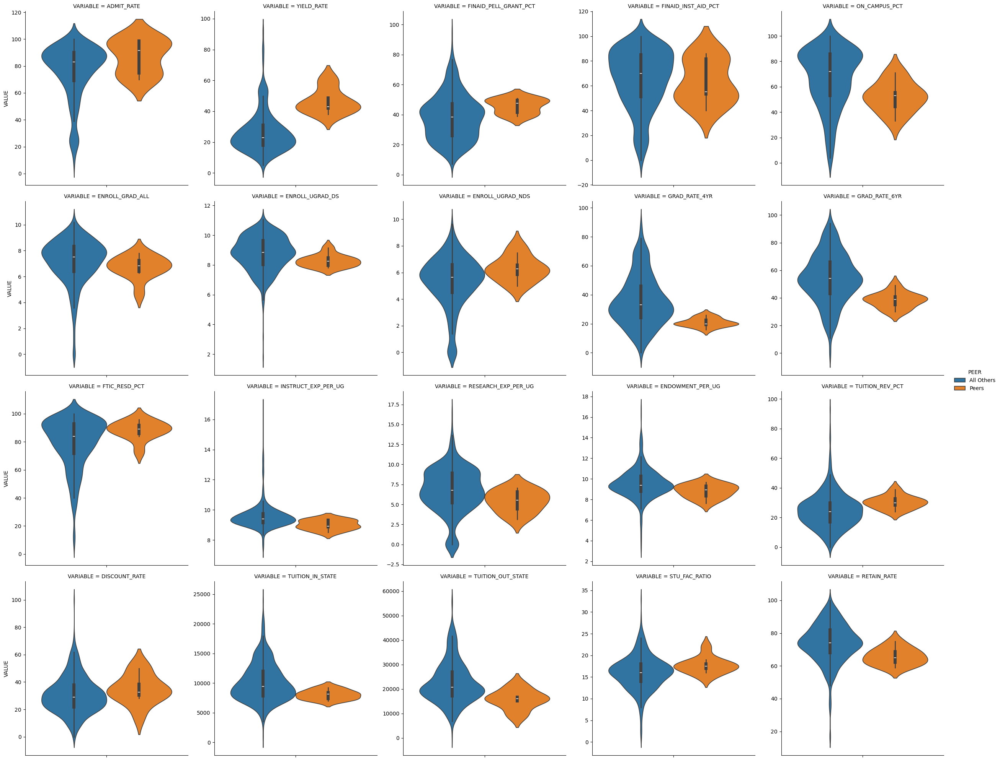

In [12]:
df_temp = (df_ipeds
           .loc[df_ipeds["INST_ID"] != 178387]
           .assign(ENROLL_GRAD_ALL     = np.log(df_ipeds["ENROLL_GRAD_ALL"]+1),
                   ENROLL_UGRAD_DS     = np.log(df_ipeds["ENROLL_UGRAD_DS"]+1),
                   ENROLL_UGRAD_NDS    = np.log(df_ipeds["ENROLL_UGRAD_NDS"]+1),
                   INSTRUCT_EXP_PER_UG = np.log(df_ipeds["INSTRUCT_EXP_PER_UG"]+1),
                   RESEARCH_EXP_PER_UG = np.log(df_ipeds["RESEARCH_EXP_PER_UG"]+1),
                   ENDOWMENT_PER_UG    = np.log(df_ipeds["ENDOWMENT_PER_UG"]+1))
           .melt(id_vars = df_ipeds.iloc[:,0:4].columns, var_name = "VARIABLE", value_name = "VALUE")
           .merge(df_peers[["PEER_ID", "DISTANCE"]], left_on = "INST_ID", right_on = "PEER_ID", how = "left")
           .assign(PEER = lambda x : np.where(x["PEER_ID"].isnull(), "All Others", "Peers"))
)

## plotting variables
sns.catplot(data = df_temp, 
            kind = "violin", 
            hue  = "PEER",
            y    = "VALUE", 
            col  = "VARIABLE", 
            col_wrap = 5,
            sharey   = False)

## Conclusion & Next Steps

This analysis is intended as a proof of concept rather than a definitive guide to identifying peer institutions. Ultimately, each school should determine which variables it wants to prioritize when selecting peers. Additionally, if schools wanted certain variables to have a greater impact when identifying peer institutes, this framework could be extended to weight certain variables more heavily. To do this, you would simply multiply a variable by a constant after standardizing features. 